# **Propósito del proyecto:**

El objetivo de este proyecto es limpiar los datos de los archivos para realizar un posterior análisis exploratorio y la visualización de la información contenida en ellos. 

## Información contenida en los datos:

Estos dos conjuntos de datos están relacionados con campañas de *marketing* telefónico de una entidad bancaria portuguesa. Las campañas de marketing se basaron en llamadas telefónicas que algunas veces , requerían más de un contacto con el mismo cliente para de conseguir la contrartación del producto bancario o no llegar a conseguir dicha contratación. 

El primer *dataset* contiene información personal sobre los clientes, información bancaria e información sobre las camapañas realizadas en un archivo csv denominado 'bank-additional.csv'.

### 'bank-additional.csv' colummas:


- **age**: La edad del cliente.

- **job**: La ocupación o profesión del cliente.

- **marital**: El estado civil del cliente.

- **education**: El nivel educativo del cliente.

- **default**: Indica si el cliente tiene algún historial de incumplimiento de pagos (1: Sí, 0: No).

- **housing**: Indica si el cliente tiene un préstamo hipotecario (1: Sí, 0: No).

- **loan**: Indica si el cliente tiene algún otro tipo de préstamo (1: Sí, 0: No).

- **contact**: El método de contacto utilizado para comunicarse con el cliente.

- **duration**: La duración en segundos de la última interacción con el cliente.

- **campaign**: El número de contactos realizados durante esta campaña para este cliente.

- **pdays**: Número de días que han pasado desde la última vez que se contactó con el cliente durante esta campaña.

- **previous**: Número de veces que se ha contactado con el cliente antes de esta campaña.

- **poutcome**: Resultado de la campaña de marketing anterior.

- **emp.var.rate**: La tasa de variación del empleo.

- **cons.price.idx**: El índice de precios al consumidor.

- **cons.conf.idx**: El índice de confianza del consumidor.

- **euribor3m**: La tasa de interés de referencia a tres meses.

- **nr.employed**: El número de empleados.

- **y**: Indica si el cliente ha suscrito un producto o servicio (Sí/No).

- **date**: La fecha en la que se realizó la interacción con el cliente.

- **contact_month**: Mes en el que se realizó la interacción con el cliente durante la campaña de marketing.

- **contact_year**: Año en el que se realizó la interacción con el cliente durante la campaña de marketing.

- **id_**: Un identificador único para cada registro en el dataset.

El segundo set de datos es un excel nombrado 'customer-details.xlsx' que nos da información personal de los clientes del banco. Este excel consta de 3 hojas de trabajo diferentes, en cada una de ellas tenemos los clientes que entraron en el banco en los años 2012, 2013 y 2014. 

### 'customer-details.xlsx' columnas:

- **Income**: Representa el ingreso anual del cliente en términos monetarios.

- **Kidhome**: Indica el número de niños en el hogar del cliente.

- **Teenhome**: Indica el número de adolescentes en el hogar del cliente.

- **Dt_Customer**: Representa la fecha en que el cliente se convirtió en cliente de la empresa.

- **NumWebVisitsMonth**: Indica la cantidad de visitas mensuales del cliente al sitio web de la empresa.

- **ID**: Identificador único del cliente.

## Importar librerias necesarías para realizar el EDA.

In [37]:
# Tratamiento de datos
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None) # muestra todas las columnas, no solo un muestreo

# Imputación de nulos
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer

# Librerías de visualización
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## 1. EDA del primer dataset ('bank-additional.csv'):

### Cargar el archivo csv 'bank-additional.csv':

In [38]:
bank = pd.read_csv('data/bank-additional.csv',index_col = 0) # index_col = 0 para omitir el indice que pone pandas al cargar el datraframe

### Visualizar nombre de las columnas y las primeras 5 filas para comprobar que se ha cargado correctamente:

In [39]:
bank.head() # 5 primeras filas

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,date,latitude,longitude,id_
0,NaN,housemaid,MARRIED,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,089b39d8-e4d0-461b-87d4-814d71e0e079
1,57.0,services,MARRIED,high.school,NaN,0.0,0.0,telephone,149,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,e9d37224-cb6f-4942-98d7-46672963d097
2,37.0,services,MARRIED,high.school,0.0,1.0,0.0,telephone,226,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,15-febrero-2019,34.939,-94.847,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,40.0,admin.,MARRIED,basic.6y,0.0,0.0,0.0,telephone,151,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-noviembre-2015,49.041,-70.308,9991fafb-4447-451a-8be2-b0df6098d13e
4,56.0,services,MARRIED,high.school,0.0,0.0,1.0,telephone,307,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-enero-2017,38.033,-104.463,eca60b76-70b6-4077-80ba-bc52e8ebb0eb


### Dimensiones del set de datos:

In [40]:
print(f'Número de filas: {bank.shape[0]}\nNúmero de columnas: {bank.shape[1]}') 

Número de filas: 43000
Número de columnas: 23


### Visualizar el nombre de las columnas con el tipo de datos y si tienen nulos.

In [41]:
bank.info() # visualiza el nombre de las columnas, la cantidad de no nulos y el tipo de datos

<class 'pandas.core.frame.DataFrame'>
Index: 43000 entries, 0 to 27570
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             37880 non-null  float64
 1   job             42655 non-null  object 
 2   marital         42915 non-null  object 
 3   education       41193 non-null  object 
 4   default         34019 non-null  float64
 5   housing         41974 non-null  float64
 6   loan            41974 non-null  float64
 7   contact         43000 non-null  object 
 8   duration        43000 non-null  int64  
 9   campaign        43000 non-null  int64  
 10  pdays           43000 non-null  int64  
 11  previous        43000 non-null  int64  
 12  poutcome        43000 non-null  object 
 13  emp.var.rate    43000 non-null  float64
 14  cons.price.idx  42529 non-null  object 
 15  cons.conf.idx   43000 non-null  object 
 16  euribor3m       33744 non-null  object 
 17  nr.employed     43000 non-null  obje

Algunas de las columnas tienen nulos y será necesario determinar que hacer con esos nulos.

**Columnas con nulos:**
age, job, marital, education, default, housing, loan, cons.price.idx, euribor3m, date

Según la informacióbn de los datos que contiene cada columna se puede determinar que algunas de ellas tienen tipos de datos erroneos que habrá que cambiar.

**Columnas con tipo de datos erroneo:**
- cons.price.idx (texto) convertir a decimal
- cons.conf.idx (texto) conveertir a decimal
- euribor3m (texto) convertir a decimal
- nr.employed (texto) convertira entero
- date (texto) convertir a fecha
- default (decimal) convertir a entero
- housing (decimal) convertir a entero
- loan (decimal) convertir a entero

### Descripción estadistica de las columnas numéricas:

In [42]:
bank.describe().T # descripción estadistica de columnas numéricas por defecto, con .T muestra las transposición de las mismas

,count,mean,std,min,25%,50%,75%,max
age,37880.0,39.977112,10.437957,17.000,32.00000,38.0000,47.00000,98.000
default,34019.0,0.000088,0.009390,0.000,0.00000,0.0000,0.00000,1.000
housing,41974.0,0.535998,0.498708,0.000,0.00000,1.0000,1.00000,1.000
loan,41974.0,0.155620,0.362499,0.000,0.00000,0.0000,0.00000,1.000
duration,43000.0,257.739279,258.666033,0.000,102.00000,179.0000,319.00000,4918.000
campaign,43000.0,2.567233,2.772294,1.000,1.00000,2.0000,3.00000,56.000
pdays,43000.0,962.330953,187.260394,0.000,999.00000,999.0000,999.00000,999.000
previous,43000.0,0.174023,0.497366,0.000,0.00000,0.0000,0.00000,7.000
emp.var.rate,43000.0,0.077128,1.573898,-3.400,-1.80000,1.1000,1.40000,1.400
latitude,43000.0,36.856697,7.225948,24.396,30.61475,36.7610,43.11325,49.384


La información de este data frame muestra:
- que las columnas default, housing y loan tienen unos y ceros
- pdays tiene una anomalia en los valores teniendo 999 en los días que han pasado desde el último contacto, posiblemente sea el valor arbitrario que le daban en el banco a los clientes con los que no se había contactado
- duration puede que tenga outliers
- campaign puede que tenga outliers
- las columnas latitude y longitude son coordenadas y no es necesario sacar información estadistica de ellas

### Descripción estadistica de las columnas categóricas:

In [43]:
bank.describe(include ='O').T # para las columnas categóricas, la "O" equivale a object

,count,unique,top,freq
job,42655,11,admin.,10873
marital,42915,3,MARRIED,25999
education,41193,7,university.degree,12722
contact,43000,2,cellular,27396
poutcome,43000,3,NONEXISTENT,37103
cons.price.idx,42529,26,"93,994",7938
cons.conf.idx,43000,26,"-36,4",8020
euribor3m,33744,309,"4,857",2287
nr.employed,43000,11,"5228,1",16980
y,43000,2,no,38156


De esta visualización se puede concluir que id_ no se repite, por lo que es el identificador único de cada cliente.

### Elementos únicos de las columnas categóricas y la cantidad de veces que se repiten:

In [44]:
# Primero un Data Frame sólo con las columnas categóricas
bank_categoricas = bank.select_dtypes(include = 'O')

In [48]:
# Lista con los nombres de todas las columnas
lista_columnas = bank_categoricas.columns.tolist()# Al añadir .tolist() convierte el tipo index a lista para poder iterar por él.

# Para ver los valores únicos y el conteo de cada uno
for columna in lista_columnas:
    print(f'{columna.upper()}\n')
    print(f'Valóres únicos: {bank[columna].unique()}\n')# Imprime los valores únicos de la columna
    print(f'Columna {bank[columna].value_counts()}') # Contador de cada valor único
    print('----------------------------------------------------\n')

JOB

Valóres únicos: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' nan 'entrepreneur' 'student']

Columna job
admin.           10873
blue-collar       9654
technician        7026
services          4162
management        3050
retired           1790
entrepreneur      1522
self-employed     1489
housemaid         1123
unemployed        1063
student            903
Name: count, dtype: int64
----------------------------------------------------

MARITAL

Valóres únicos: ['MARRIED' 'SINGLE' 'DIVORCED' nan]

Columna marital
MARRIED     25999
SINGLE      12105
DIVORCED     4811
Name: count, dtype: int64
----------------------------------------------------

EDUCATION

Valóres únicos: ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course' nan
 'university.degree' 'illiterate']

Columna education
university.degree      12722
high.school             9925
basic.9y                6309
professional.course     5477
basic.4

Valóres únicos: ['2-agosto-2019' '14-septiembre-2016' '15-febrero-2019' ... '28-mayo-2016'
 '22-abril-2015' '7-marzo-2015']

Columna date
28-febrero-2018      95
28-febrero-2016      94
28-febrero-2015      92
28-febrero-2017      89
28-febrero-2019      85
                     ..
2-julio-2016         11
14-abril-2015        10
20-noviembre-2015    10
4-abril-2017         10
21-diciembre-2019    10
Name: count, Length: 1825, dtype: int64
----------------------------------------------------

ID_

Valóres únicos: ['089b39d8-e4d0-461b-87d4-814d71e0e079'
 'e9d37224-cb6f-4942-98d7-46672963d097'
 '3f9f49b5-e410-4948-bf6e-f9244f04918b' ...
 'cadadd4b-7ee5-4019-b13a-ca01bb67ca5b'
 '5f432048-d515-4bb5-9c94-62db451f88d4'
 '993bbbd6-4dbc-4a40-a408-f91f8462bee6']

Columna id_
089b39d8-e4d0-461b-87d4-814d71e0e079    1
c25b5d31-bb7e-41af-898d-42bf3e479351    1
bfd6bad9-f23a-445a-838e-10ee90110534    1
075b0e72-b5e3-43f4-90cd-29f9090b2b1a    1
482a2d86-c9f0-46b7-9f6f-82c769690d48    1
               

### Análisis de los valores de las columnas categóricas:
- **job**: Valor más repetido 'admin',  11 únicos y tiene nulos.

- **marital**: Valores únicos 3 (MARRIED, SINGLE, DIVORCED), más repetido 'MARRIED' y tiene nulos

- **education**:7 únicos. Valor más repetido 'university degree', menos repetido 'illiterate' con 18 registros. Tiene nulos

- **contact**: 2 valores (telephone y cellular). El segundo tiene casi el doble de registros que el primero. No tiene nulos

- **poutcome**: 3 valores (NONEXISTENT, FAILURE, SUCCESS). Tenemos notablemente más datos del primero que del resto. No tiene nulos

- **cons.price.idx**: Es una falsa columna categórica. Tiene nulos

- **cons.conf.idx**: Es una falsa columna categórica. No tiene nulos

- **euribor3m**: Es una falsa columna categórica.Tiene nulos

- **nr.employed**: Es una falsa columna categórica. No tiene nulos

- **y**: 2 valores (no, yes). No: 38156, Yes: 4844. No tiene nulos.

- **date**: Falsa columna categórica.es una fecha

- **id_**: Identificador único. Sin nulos.

### Cantidad de nulos por columna:

In [49]:
print('Nulos por columna:')
bank.isnull().sum()

Nulos por columna:


age               5120
job                345
marital             85
education         1807
default           8981
housing           1026
loan              1026
contact              0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx     471
cons.conf.idx        0
euribor3m         9256
nr.employed          0
y                    0
date               248
latitude             0
longitude            0
id_                  0
dtype: int64

### Cantidad de valores duplicados:

In [50]:
print('Cantidad de duplicados por columna:')
bank.duplicated().sum() 

Cantidad de duplicados por columna:


0

## 2. EDA del segundo Dataset 'customer-details.xlsx':

### Data Frame para cada hoja del archivo de excel:

In [51]:
#DF distintos, uno para cada hoja.
customer_2012 = pd.read_excel('data/customer-details.xlsx', sheet_name='2012', index_col = 0)
customer_2013 = pd.read_excel('data/customer-details.xlsx', sheet_name='2013', index_col = 0)
customer_2014 = pd.read_excel('data/customer-details.xlsx', sheet_name='2014', index_col = 0)

In [52]:
# Lista con los 3 DataFrames para poder hacer el EDA de los 3 al mismo tiempo
lista_customer = [customer_2012,customer_2013,customer_2014]

### Ver una muestra de las primeras filas de cada uno de los data frames.

In [53]:
# Ver primeras filas de cada DF
for df in lista_customer:
    display(df.head())
    

,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb


,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,82407,0,1,2013-10-07,29,ef81336c-e41a-46d0-8a30-5d4ac3b836be
1,24877,0,0,2013-04-21,32,50b224ac-84b4-42a7-aba9-3e1d1d620479
2,78839,1,0,2013-11-25,21,9cb15c53-b647-464a-add9-09cdae04897c
3,113859,1,1,2013-01-06,12,f8aaf334-949d-4943-a214-b64fe9c088b4
4,147317,0,0,2013-07-10,14,885fe85a-3718-4760-a32a-a57628cf7528


,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,168812,1,1,2014-06-10,27,4d6c811c-0f24-4a73-b374-2ebd1f80d46e
1,108615,2,1,2014-04-05,24,eef0f24f-cbdb-4c67-b371-09d7bc59695e
2,179041,0,2,2014-09-22,4,bbfdcedd-199d-4927-94bb-5dad051ff471
3,116639,2,2,2014-08-16,3,e8ebb67d-4ee1-4615-b701-eefe3af607eb
4,49537,0,1,2014-09-05,28,f7f79ace-0024-4505-a401-f340946f0942


Tienen las mismas columnas con los mismos nombres.

### Dimensiones de cada uno de los data frames.

In [54]:
# Iterar en un enumerate con la lista_customer y empieza en 2012
for year, df in enumerate(lista_customer, start = 2012):
    print(f'Número de filas  customer_{year}: {df.shape[0]} - Número de columnas: {df.shape[1]}') #tupla con filas y columnas.

Número de filas  customer_2012: 20115 - Número de columnas: 6
Número de filas  customer_2013: 8965 - Número de columnas: 6
Número de filas  customer_2014: 14090 - Número de columnas: 6


In [56]:
print('Información de los 3 DataFrames:\n')
for df in lista_customer:
    print(df.info())

Información de los 3 DataFrames:

<class 'pandas.core.frame.DataFrame'>
Index: 20115 entries, 0 to 20114
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Income             20115 non-null  int64         
 1   Kidhome            20115 non-null  int64         
 2   Teenhome           20115 non-null  int64         
 3   Dt_Customer        20115 non-null  datetime64[ns]
 4   NumWebVisitsMonth  20115 non-null  int64         
 5   ID                 20115 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 1.1+ MB
None
<class 'pandas.core.frame.DataFrame'>
Index: 8965 entries, 0 to 8964
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Income             8965 non-null   int64         
 1   Kidhome            8965 non-null   int64         
 2   Teenhome           8965

Una vez comprobado que la cantidad de columnas y que son del mismo tipo, ae puede hacer la unión de los data frames en uno solo.

### Unir verticalmente los data frames con las hojas de Excel:

In [57]:
# Concatenar los data frames indexado por el indice único
customer_concat = pd.concat([customer_2012, customer_2013, customer_2014], axis = 0, ignore_index = True)
customer_concat.head() # muestra de las primeras filas

,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb


### Comprobar las columnas y si el número de filas coincide con las suma de las filas de los data frames concatenados.

In [58]:
print(f'Número de filas en customer_concat: {customer_concat.shape[0]} - Número de columnas: {customer_concat.shape[1]}')

Número de filas en customer_concat: 43170 - Número de columnas: 6


### Comprobación de las información que contienen las columnas del nuevo data frame, los nulos y los duplicados.

In [59]:
customer_concat.info() # información de las columnas

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43170 entries, 0 to 43169
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Income             43170 non-null  int64         
 1   Kidhome            43170 non-null  int64         
 2   Teenhome           43170 non-null  int64         
 3   Dt_Customer        43170 non-null  datetime64[ns]
 4   NumWebVisitsMonth  43170 non-null  int64         
 5   ID                 43170 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 2.0+ MB


In [60]:
print('Cantidad de nulos:')
customer_concat.isnull().sum() # suma de los nulos

Cantidad de nulos:


Income               0
Kidhome              0
Teenhome             0
Dt_Customer          0
NumWebVisitsMonth    0
ID                   0
dtype: int64

In [61]:
print('Cantidad de duplicados:', customer_concat.duplicated().sum()) # suma de los duplicados

Cantidad de duplicados: 0


### Comparación de las dimensiones de los dos dataframes, customer_concat y bank.

In [62]:
print(f'Número de filas en bank: {bank.shape[0]}, y el número de columnas: {bank.shape[1]}')
print(f'Número de filas en customer_concat: {customer_concat.shape[0]}, y el número de columnas: {customer_concat.shape[1]}')

Número de filas en bank: 43000, y el número de columnas: 23
Número de filas en customer_concat: 43170, y el número de columnas: 6


Hay mayor cantidad de clientes de los que han participado en la campaña.

In [63]:
bank.head(3)

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,date,latitude,longitude,id_
0,NaN,housemaid,MARRIED,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,089b39d8-e4d0-461b-87d4-814d71e0e079
1,57.0,services,MARRIED,high.school,NaN,0.0,0.0,telephone,149,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,e9d37224-cb6f-4942-98d7-46672963d097
2,37.0,services,MARRIED,high.school,0.0,1.0,0.0,telephone,226,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,15-febrero-2019,34.939,-94.847,3f9f49b5-e410-4948-bf6e-f9244f04918b


In [64]:
customer_concat.head()

,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb


El identificador id es el campo en común por el que se puede hacer la unión de los dos dataframes.

### Unir los Dataframes horizontalmente para solo obtener los valores coincidentes:

In [65]:
bank = bank.merge(customer_concat,how = 'inner', left_on = 'id_', right_on = 'ID') # une los dos data frames por los valores coincidentes
bank.head()

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,date,latitude,longitude,id_,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,NaN,housemaid,MARRIED,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,089b39d8-e4d0-461b-87d4-814d71e0e079,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,57.0,services,MARRIED,high.school,NaN,0.0,0.0,telephone,149,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,e9d37224-cb6f-4942-98d7-46672963d097,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,37.0,services,MARRIED,high.school,0.0,1.0,0.0,telephone,226,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,15-febrero-2019,34.939,-94.847,3f9f49b5-e410-4948-bf6e-f9244f04918b,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,40.0,admin.,MARRIED,basic.6y,0.0,0.0,0.0,telephone,151,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-noviembre-2015,49.041,-70.308,9991fafb-4447-451a-8be2-b0df6098d13e,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,56.0,services,MARRIED,high.school,0.0,0.0,1.0,telephone,307,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-enero-2017,38.033,-104.463,eca60b76-70b6-4077-80ba-bc52e8ebb0eb,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb


### Eliminar la columna que ha quedado repetida con el id de cliente:

In [66]:
bank.drop('id_', axis = 1, inplace = True) # eliminar la columna id_ axis = 1 eliminar los datos de una columna, axis = 0 de una fila. inplace=True sobreescribir el DF

### Comprobar que la coluna se ha borrado correctamente:

In [67]:
bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y', 'date', 'latitude', 'longitude', 'Income',
       'Kidhome', 'Teenhome', 'Dt_Customer', 'NumWebVisitsMonth', 'ID'],
      dtype='object')

### Homogeneizar nombres de columnas, para un mejor manejo a la hora de programar.

Sustituir los '.' por '_' y poner todos los nombres en minúsculas.

In [68]:
nuevas_columnas = {columna:columna.lower().replace('.', '_') for columna in bank.columns} # itera por los nombres de las columnas pasandolos a minusculas y sustiyuendo los . por _. Crea un diccionario cuya clave es el nombre antiguo y el valor es el nombre cambiado

In [69]:
bank.rename(columns = nuevas_columnas, inplace = True) # método rename para renombrar con los nombres del diccionario
bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp_var_rate', 'cons_price_idx', 'cons_conf_idx', 'euribor3m',
       'nr_employed', 'y', 'date', 'latitude', 'longitude', 'income',
       'kidhome', 'teenhome', 'dt_customer', 'numwebvisitsmonth', 'id'],
      dtype='object')

Cambiar los datos a minúsculas.

In [70]:
for columna in bank.columns.to_list(): # recorrer los valores de las columnas
    try:
        bank[columna] = bank[columna].str.lower() # pasar a minusculas
    except:
        pass

In [71]:
bank.head(3)

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,date,latitude,longitude,income,kidhome,teenhome,dt_customer,numwebvisitsmonth,id
0,NaN,housemaid,married,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,nonexistent,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,57.0,services,married,high.school,NaN,0.0,0.0,telephone,149,1,999,0,nonexistent,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,37.0,services,married,high.school,0.0,1.0,0.0,telephone,226,1,999,0,nonexistent,1.1,"93,994","-36,4","4,857",5191,no,15-febrero-2019,34.939,-94.847,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b


In [72]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43000 entries, 0 to 42999
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   age                37880 non-null  float64       
 1   job                42655 non-null  object        
 2   marital            42915 non-null  object        
 3   education          41193 non-null  object        
 4   default            34019 non-null  float64       
 5   housing            41974 non-null  float64       
 6   loan               41974 non-null  float64       
 7   contact            43000 non-null  object        
 8   duration           43000 non-null  int64         
 9   campaign           43000 non-null  int64         
 10  pdays              43000 non-null  int64         
 11  previous           43000 non-null  int64         
 12  poutcome           43000 non-null  object        
 13  emp_var_rate       43000 non-null  float64       
 14  cons_p

### Crear un data frame donde guardar el día, el mes y el año en distintas columnas. para posteriormente crear la columna año y la columna mes.

In [73]:
fecha = bank['date'].str.split('-', expand = True) # geneera un data frame con las columnas día, mes y año
fecha

,0,1,2
0,2,agosto,2019
1,14,septiembre,2016
2,15,febrero,2019
3,29,noviembre,2015
4,29,enero,2017
...,...,...,...
42995,13,octubre,2015
42996,17,marzo,2018
42997,15,septiembre,2016
42998,23,septiembre,2019


In [74]:
# nueva columna mes
bank['contact_month'] = fecha[1]
# nueva columna año
bank['contact_year'] = fecha[2]

In [75]:
bank.head(2)

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,date,latitude,longitude,income,kidhome,teenhome,dt_customer,numwebvisitsmonth,id,contact_month,contact_year
0,NaN,housemaid,married,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,nonexistent,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079,agosto,2019
1,57.0,services,married,high.school,NaN,0.0,0.0,telephone,149,1,999,0,nonexistent,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097,septiembre,2016


Convertir columna 'date' a tipo fecha.

In [76]:
    #Diccionario con la clave nombre del mes y el valor el número del mes
meses = {'enero':'01',
        'febrero':'02',
        'marzo':'03',
        'abril':'04',
        'mayo':'05',
        'junio':'06',
        'julio':'07',
        'agosto':'08',
        'septiembre':'09',
        'octubre':'10',
        'noviembre':'11',
        'diciembre':'12'
    }
bank.replace({'date':meses}, regex = True,inplace = True) # reemplaza los nombres de los meses por el número

bank['date'] = pd.to_datetime(bank['date'], format = "%d-%m-%Y") # datetime para cambiar a tipo fecha

In [77]:
bank['date'].head()

0   2019-08-02
1   2016-09-14
2   2019-02-15
3   2015-11-29
4   2017-01-29
Name: date, dtype: datetime64[ns]

### Reemplazar los puntos por espacios en la columna 'education':

In [78]:
bank['education'] = bank['education'].str.replace('.',' ') # reemplaza los puntos por espacios

In [79]:
bank['education'].head()

0       basic 4y
1    high school
2    high school
3       basic 6y
4    high school
Name: education, dtype: object

### Convertir a decimal las columnas: 'cons_price_idx','cons_conf_idx','euribor3m','nr_employed':

In [80]:
# lista con los nombres de las columnas a convertir
str_float = ['cons_price_idx','cons_conf_idx','euribor3m','nr_employed']
# Itera por la lista
for col in str_float:
    #Sustituye las ',' por '.'
    bank[col] = bank[col].str.replace(',','.')
    #función lambda para cambiar el tipo de dato
    bank[col] = bank[col].apply(lambda x: float(x))

In [81]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43000 entries, 0 to 42999
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   age                37880 non-null  float64       
 1   job                42655 non-null  object        
 2   marital            42915 non-null  object        
 3   education          41193 non-null  object        
 4   default            34019 non-null  float64       
 5   housing            41974 non-null  float64       
 6   loan               41974 non-null  float64       
 7   contact            43000 non-null  object        
 8   duration           43000 non-null  int64         
 9   campaign           43000 non-null  int64         
 10  pdays              43000 non-null  int64         
 11  previous           43000 non-null  int64         
 12  poutcome           43000 non-null  object        
 13  emp_var_rate       43000 non-null  float64       
 14  cons_p

### Cambiar los valores 0 y 1 por No y Si en las columnas: 'default','housing','loan':

In [82]:
# crear diccionario
diccionario_mapeo = {0: "No", 1: "Si"}
# lista con las columnas
mapear = ['default','housing','loan']
# Itera por la lista y cambia los valores
for col in mapear:
    bank[col] = bank[col].map(diccionario_mapeo)

En la columna 'pdays' hay valores 999, lo que indica que ese valor se añadía cuando no se había contactado con el cliente por lo que lo aconsejable es cambiar ese valor por 'null' para que no altere el resultado si hay que hacer algún calculo con esta columna.

#### Cambiar 999 por nan en la columna 'pdays':

In [83]:
# método '.replace()' sobre la columna 'pdays' para reemplazar los valores 999 por nulos de numpy (np.nan)
bank['pdays'] = bank['pdays'].replace(999, np.nan)


In [84]:
bank.head(3)

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,date,latitude,longitude,income,kidhome,teenhome,dt_customer,numwebvisitsmonth,id,contact_month,contact_year
0,NaN,housemaid,married,basic 4y,No,No,No,telephone,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2019-08-02,41.495,-71.233,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079,agosto,2019
1,57.0,services,married,high school,NaN,No,No,telephone,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,NaN,5191.0,no,2016-09-14,34.601,-83.923,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097,septiembre,2016
2,37.0,services,married,high school,No,Si,No,telephone,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2019-02-15,34.939,-94.847,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b,febrero,2019


## Guardar el archivo limpio en formato csv. Para tener una copia de seguridad de la limpieza antes de continuar.

In [85]:
bank.to_csv('data/bank-limpio.csv') # guardar data frame en archivo csv

## Cargar el archivo con los datos limpios para continuar con la transformación. 

In [86]:
bank = pd.read_csv('data/bank-limpio.csv',index_col = 0)

## Sustituir los valores nulos en las columnas que los tengan, según cada necesidad individual.

In [87]:
# porcentaje de nulos en las columnas.
nulos = (bank.isnull().sum() / bank.shape[0]) * 100

# convierte el cálculo anterior a DataFrame
df_nulos = pd.DataFrame(nulos, columns = ['%_nulos'])

# Filtra las columnas que tengan nulos
df_nulos[df_nulos['%_nulos'] > 0]

,%_nulos
age,11.906977
job,0.802326
marital,0.197674
education,4.202326
default,20.886047
housing,2.386047
loan,2.386047
pdays,96.306977
cons_price_idx,1.095349
euribor3m,21.525581


### Gestión de nulos en las columnas categóricas:

In [88]:
#lista de columnas categóricas que tienen nulos
col_nulos_categoricas = bank[bank.columns[bank.isnull().any()]].select_dtypes(include = 'O').columns
print('Columnas categóricas con nulos: \n ')
print(col_nulos_categoricas)

Columnas categóricas con nulos: 
 
Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'date',
       'contact_month'],
      dtype='object')


In [89]:
# distribución de los valores por categoría
for col in col_nulos_categoricas:
    print(f'La distribución de las categorías para la columna {col.upper()}')
    print(f'{bank[col].value_counts() / bank.shape[0]*100} %') # % de aparición
    print('-----------------------------------------------------')

La distribución de las categorías para la columna JOB
job
admin.           25.286047
blue-collar      22.451163
technician       16.339535
services          9.679070
management        7.093023
retired           4.162791
entrepreneur      3.539535
self-employed     3.462791
housemaid         2.611628
unemployed        2.472093
student           2.100000
Name: count, dtype: float64 %
-----------------------------------------------------
La distribución de las categorías para la columna MARITAL
marital
married     60.462791
single      28.151163
divorced    11.188372
Name: count, dtype: float64 %
-----------------------------------------------------
La distribución de las categorías para la columna EDUCATION
education
university degree      29.586047
high school            23.081395
basic 9y               14.672093
professional course    12.737209
basic 4y               10.130233
basic 6y                5.548837
illiterate              0.041860
Name: count, dtype: float64 %
--------------

### Conclusiones de los valores únicos
- **job**: 11 valores. El resultado principal es 'admin' 25%, seguido de 'blue-collar' 22% , no hay una diferencia significativa.

- **marital**: 3 valores (married,single y divorced), married destaca muy por encima del resto con un 60%.

- **education**: 7 valores. No hay ningún valor que destaque frente al resto.

- **default**: Sólo tenemos dos valores (No y Si). El 'No' tiene un 79% de aparición.

- **housing**: Valores 'Si' y 'No'. No hay ningún valor que destaque frente al otro.

- **loan**: Sólo tenemos dos valores (No y Si). El 'No' tiene un 82% de aparición

- **date**: Son fechas, los valores no destacan entre si.

- **contact_month**: Son meses y los valores se reparten de manera equitativa entre todos los meses.

 - ## Columnas a reemplazar por la moda: (porque tienen valores muy destacados)

    - ### marital

    - ### loan 

    - ### default
    

In [90]:
columnas_moda = ['marital', 'loan', 'default']
# Iterar por la lista con las columnas a sustituir por la moda
for columna in columnas_moda:
    
    # Calcula la moda
    moda = bank[columna].mode()[0] # Selecciona la posición 0 ya que es el primer valor que aparezca
    
    # Método fillna reemplaza los valores nulos por la moda calculada
    bank[columna] = bank[columna].fillna(moda)

# Comprobar si se han eliminado los nulos en las columnas de "marital", "loan" y "default"
print('Cantidad de nulos después de fillna:')

bank[columnas_moda].isnull().sum()

Cantidad de nulos después de fillna:


marital    0
loan       0
default    0
dtype: int64

- ## Columnas a reemplazar por 'uknown': porque no tienen valores que destaquen demasiado, con porcentajes homogéneos.

    - ### job

    - ### education

    - ### housing

    - ### contact_month
    
    - ### date


In [91]:
columnas_desconocido = ['job', 'education', 'housing', 'contact_month', 'date']
#Iitera por la lista de columnas para cambiar los nulos por 'uknown'
for columna in columnas_desconocido:
    
    # Reemplaza los nulos por el valor unknown
    bank[columna] = bank[columna].fillna('unknown')
    
# Comprobar nulos 
print('Cantidad de nulos depués de fillna:')
bank[columnas_desconocido].isnull().sum()

Cantidad de nulos depués de fillna:


job              0
education        0
housing          0
contact_month    0
date             0
dtype: int64

## Gestión de nulos en las columnas numéricas:

In [92]:
# lista de columnas numéricas que tienen nulos
nulos_esta_num = bank[bank.columns[bank.isnull().any()]].select_dtypes(include = np.number).columns
print('Columnas numéricas con nulos:\n')
print(nulos_esta_num)

Columnas numéricas con nulos:

Index(['age', 'pdays', 'cons_price_idx', 'euribor3m', 'contact_year'], dtype='object')


In [93]:
# porcentaje de nulos en cada una de las columnas numericas
bank[nulos_esta_num].isnull().sum() / bank.shape[0]*100

age               11.906977
pdays             96.306977
cons_price_idx     1.095349
euribor3m         21.525581
contact_year       0.576744
dtype: float64

### La columna 'contact_year' aunque es numérica no se va a operar con ella por lo que no es necesario tratarla como numérica, sustituir nulos por 'unknown' junto con la columna 'pdays' porque esta tiene gran cantidad de nulos.

In [94]:
columnas_num_desconocido = ['contact_year', 'pdays']

# itera por la lista de columnas 
for columna in columnas_num_desconocido:
    
    # Reemplaza los nulos por el valor unknown
    bank[columna] = bank[columna].fillna('unknown')
    
# Comprobar nulos 
print('Cantidad de nulos depués de fillna:')
bank[columnas_num_desconocido].isnull().sum()

Cantidad de nulos depués de fillna:


contact_year    0
pdays           0
dtype: int64

### Comprobación de outliers en las columnas que quedan con nulos para ver como interesa más sustituir los nulos. Utilizando un grafico de caja de bigotes.

In [95]:
fig = make_subplots(
    rows = 2, cols = 2,
    specs = [[{'colspan': 2},None], [{'type': 'xy'},{'type': 'xy'}]], subplot_titles = ['age', 'cons_price_idx','euribor3m'])
fig.add_trace(go.Box(x = bank['age']
             ),
             row = 1,col = 1)
fig.add_trace(go.Box(x = bank['cons_price_idx']
             ),
             row = 2,col = 1),
fig.add_trace(go.Box(x = bank['euribor3m']
             ),
             row = 2,col = 2)

Se puede observar que sólamente 'age' tiene outliers.

La columna 'cons_price_idx' tiene un porcentaje muy pequeño de nulos y no tiene outliers, por lo tanto voy a sustituir los nulos por la media o por la mediana dependiendo de cual  de las dos tenga una desvicación más baja.

### Gestión de la columna 'cons_price_idx':

In [97]:
bank['cons_price_idx'].describe()[['mean', '50%','std']] # visualiza la media, la mediana y la desviación típica.

mean    93.574219
50%     93.749000
std      0.579548
Name: cons_price_idx, dtype: float64

In [98]:
# crea una variable con el valor de la media y otro con el de la mediana
media_conspriceidx = bank['cons_price_idx'].mean()
mediana_conspriceidx = bank['cons_price_idx'].median()
# Crea un DF sólo con la columna.
bank_consprice = bank['cons_price_idx'].reset_index()
# Aplica el método 'fillna()' a la columna. Uno con la media y otro con la mediana
bank_consprice['cons_price_idx_media'] = bank_consprice['cons_price_idx'].fillna(media_conspriceidx)
bank_consprice['cons_price_idx_mediana'] = bank_consprice['cons_price_idx'].fillna(mediana_conspriceidx)
bank_consprice

,index,cons_price_idx,cons_price_idx_media,cons_price_idx_mediana
0,0,93.994,93.994,93.994
1,1,93.994,93.994,93.994
2,2,93.994,93.994,93.994
3,3,93.994,93.994,93.994
4,4,93.994,93.994,93.994
...,...,...,...,...
42995,42995,93.444,93.444,93.444
42996,42996,93.200,93.200,93.200
42997,42997,93.918,93.918,93.918
42998,42998,93.918,93.918,93.918


In [99]:
print(f"Desviación de la media de la columna cons_price_idx:\n{bank_consprice['cons_price_idx_media'].describe()['std']}") # desviación de la media

Desviación de la media de la columna cons_price_idx:
0.5763653968490053


In [100]:
print(f"Desviación de la mediana de la columna cons_price_idx:\n{bank_consprice['cons_price_idx_mediana'].describe()['std']}") # desviación de la mediana

Desviación de la mediana de la columna cons_price_idx:
0.5766524288921129


### La desviación de la media es más baja por lo que voy a sustituir los nulos por la media.

In [101]:
bank['cons_price_idx'] = bank['cons_price_idx'].fillna(media_conspriceidx) # sustituye los nulos por la media
print(f"Nulos despues del  'fillna': {bank['cons_price_idx'].isnull().sum()}")

Nulos despues del  'fillna': 0


### Para la columna 'age' que tiene outliers y la columna 'euribor3m' que tiene un porcentaje alto de nulos se va a utilizar el método predictivo Imputer KNNImputer para rellenar los valores nulos.

In [102]:
bank_imputer = bank[['age','euribor3m']] # hace una copia del dataframe original
bank_imputer.head()

,age,euribor3m
0,NaN,4.857
1,57.0,NaN
2,37.0,4.857
3,40.0,NaN
4,56.0,NaN


In [103]:
# Instancia la clase del KNNImputer
imputer_knn = KNNImputer(n_neighbors = 5)

# Ajusta y transforma los datos
imputer_knn_imputado = imputer_knn.fit_transform(bank_imputer[['age', 'euribor3m']])

imputer_knn_imputado

array([[39.        ,  4.857     ],
       [57.        ,  4.7866    ],
       [37.        ,  4.857     ],
       ...,
       [39.97711193,  3.61652074],
       [45.4       ,  4.958     ],
       [39.2       ,  4.021     ]])

In [104]:
bank_imputer[['age_knn', 'euribor_knn']] = imputer_knn_imputado # crear columnas con los valores cambiados

C:\Users\win\AppData\Local\Temp\ipykernel_9680\2095906929.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\win\AppData\Local\Temp\ipykernel_9680\2095906929.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [105]:
# sustituir las columnas originales del DataFrame original
bank['age'] = bank_imputer['age_knn']
bank['euribor3m'] = bank_imputer['euribor_knn']

In [106]:
bank.isnull().sum() # comprobar si quedan nulos

age                  0
job                  0
marital              0
education            0
default              0
housing              0
loan                 0
contact              0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp_var_rate         0
cons_price_idx       0
cons_conf_idx        0
euribor3m            0
nr_employed          0
y                    0
date                 0
latitude             0
longitude            0
income               0
kidhome              0
teenhome             0
dt_customer          0
numwebvisitsmonth    0
id                   0
contact_month        0
contact_year         0
dtype: int64

## Una vez terminada la limpieza de nulos, guardar en un csv.

In [107]:
# Guardar el DataFrame
bank.to_csv('data/bank-limpio-sin-nulos.csv')

# **PARTE FINAL DEL EDA CON EL ARCHIVO DEFINITIVO:**

## Cargar el nuevo archivo ya limpio para continuar con el EDA.

In [108]:
bank = pd.read_csv('data/bank-limpio-sin-nulos.csv', index_col = 0) # cargar el archivo csv sin nulos

### Comprobar que no han quedado nulos:

In [109]:
bank.isnull().sum() # comprobar nulos

age                  0
job                  0
marital              0
education            0
default              0
housing              0
loan                 0
contact              0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp_var_rate         0
cons_price_idx       0
cons_conf_idx        0
euribor3m            0
nr_employed          0
y                    0
date                 0
latitude             0
longitude            0
income               0
kidhome              0
teenhome             0
dt_customer          0
numwebvisitsmonth    0
id                   0
contact_month        0
contact_year         0
dtype: int64

### Comprobar que no han quedado duplicados:

In [110]:
print(f'Cantidad de duplicados en el Dataset: {bank.duplicated().sum()}') # comprobar duplicados

Cantidad de duplicados en el Dataset: 0


## Resumen estadístico columnas numéricas:

In [111]:
bank.describe().T

,count,mean,std,min,25%,50%,75%,max
age,43000.0,39.943703,9.927421,17.000,32.20000,39.000000,46.00000,98.000
duration,43000.0,257.739279,258.666033,0.000,102.00000,179.000000,319.00000,4918.000
campaign,43000.0,2.567233,2.772294,1.000,1.00000,2.000000,3.00000,56.000
previous,43000.0,0.174023,0.497366,0.000,0.00000,0.000000,0.00000,7.000
emp_var_rate,43000.0,0.077128,1.573898,-3.400,-1.80000,1.100000,1.40000,1.400
cons_price_idx,43000.0,93.574219,0.576365,92.201,93.07500,93.574219,93.99400,94.767
cons_conf_idx,43000.0,-40.509049,4.637186,-50.800,-42.70000,-41.800000,-36.40000,-26.900
euribor3m,43000.0,3.549873,1.612193,0.634,1.40600,4.225200,4.95900,5.045
nr_employed,43000.0,5166.852602,72.411125,4963.600,5099.10000,5191.000000,5228.10000,5228.100
latitude,43000.0,36.856697,7.225948,24.396,30.61475,36.761000,43.11325,49.384


## Resumen de los valores repetidos en cada columna categórica:

In [112]:
print(bank['job'].value_counts())
print('------------------------------')
print(bank['marital'].value_counts())
print('------------------------------')
print(bank['education'].value_counts())

job
admin.           10873
blue-collar       9654
technician        7026
services          4162
management        3050
retired           1790
entrepreneur      1522
self-employed     1489
housemaid         1123
unemployed        1063
student            903
unknown            345
Name: count, dtype: int64
------------------------------
marital
married     26084
single      12105
divorced     4811
Name: count, dtype: int64
------------------------------
education
university degree      12722
high school             9925
basic 9y                6309
professional course     5477
basic 4y                4356
basic 6y                2386
unknown                 1807
illiterate                18
Name: count, dtype: int64


## Matriz de correlación de las columnas numéricas con la columna 'y':

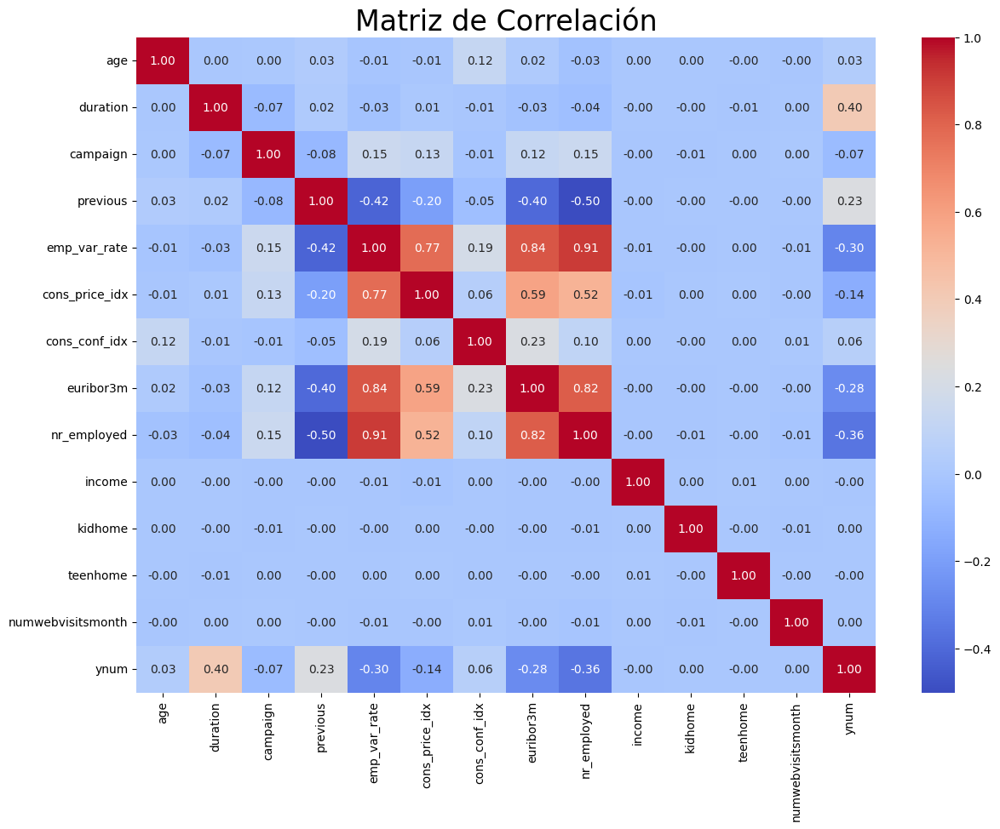

In [113]:
# Seleccionar solo las columnas numéricas
numeric_columns = bank.select_dtypes(include='number')
numeric_columns.drop(['latitude',  'longitude'], axis=1, inplace=True)


#Convertir la columna 'y' a ceros y unos y añadirla a las variables numéricas
numeric_columns['ynum'] = bank['y'].map({'no' : 0, 'yes' : 1})

# Calcular la matriz de correlación solo para columnas numéricas
correlation_matrixx = numeric_columns.corr()# Calcular la matriz de correlación

# Visualizar la matriz de correlación usando un heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrixx, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación', fontsize = 24)

plt.show()

Para buscar relaciones entre las columnas y la métrica, que es la columna ynum.

## Línea temporal con las llamadas realizadas por mes y año:

In [119]:
# Descartar los datos desconocidos
date = bank[bank['date'] != 'unknown']

# Pasar los datos de la columna 'date' a tipo datetime
date['date'] = pd.to_datetime(date['date'], format = "%Y-%m-%d")

# Agrupar contando todas las llamadas que ha habido cada día
date = date.groupby('date')['id'].count().reset_index()

# Sumar todos los datos agrupándolos por mes
date = date.resample('ME', on = 'date').sum()

date.reset_index(drop = False, inplace = True) # drop = False para que no elimine 'date' que era el indice antes del reset_index() 

# Crear el gráfico de línea
fig = go.Figure()

# Añadir la línea y los puntos con etiquetas
fig.add_trace(go.Scatter(
    x=date['date'], 
    y=date['id'],
    mode='lines+markers+text',  # Añade línea, puntos y texto
    text=date['id'],  # Añade etiquetas de datos
    textposition='top center',  # Posición del texto
    marker=dict(size=8),  # Tamaño de los puntos
    name='Número de Llamadas'
))

# Personalizar el título y etiquetas
fig.update_layout(
    title={
        'text': 'Llamadas a lo Largo del Tiempo',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24, 'color': 'black'},
    },
    titlefont=dict(size=24, family='Arial', color='black'),
     #xaxis_title='Fecha',
    #yaxis_title='Número de Llamadas',
    showlegend=False  # Oculta la leyenda
)

fig.show()

C:\Users\win\AppData\Local\Temp\ipykernel_9680\4148211858.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Gráfico de líneas comparativo de las llamadas entre los distintos años de las campañas:

In [116]:

# Extraer el año de la columna 'date'
date['year'] = date['date'].dt.year
#Extraer el mes de la columna 'date'
date['month'] = date['date'].dt.strftime('%b')

# Crear el gráfico de línea
fig = go.Figure()

# Colores para cada año
colors = {
    2015: 'red',
    2016: 'blue',
    2017: 'green',
    2018: 'orange',
    2019: 'purple'
}

# Añadir una línea para cada año
for year, color in colors.items():
    year_data = date[date['year'] == year]
    fig.add_trace(go.Scatter(
        x=year_data['month'],
        y=year_data['id'],
        mode='lines+markers+text',  # Añade línea, puntos y texto
        text=year_data['id'],  # Añade etiquetas de datos
        textposition='top center',  # Posición del texto
        marker=dict(size=8),
        name=f'Llamadas {year}', # titulo de cada linea en la leyenda
        line=dict(color=color)
    ))

# Personalizar el título y etiquetas
fig.update_layout(
    title={
        'text': 'Número de Llamadas por Mes y Año',
        'y': 0.9,
        'x': 0.44,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24, 'color': 'black', 'family': 'Arial', 'weight': 'bold'},
    },
    titlefont=dict(size=24, family='Arial', color='black'),
    # xaxis_title='Fecha (Año-Mes)',
    # yaxis_title='Número de Llamadas',
    showlegend=True  # Mostrar la leyenda
)

fig.show()


En este gráfico se puede apreciar que la diferencia de llamadas entre los meses de las distintas campañas no es significativa ya que los valores no varian en más de 100 llamadas de diferencia en mes.

## Gráfico de barras del total de llamadas por año de campaña:

In [117]:
# Extraer el año de la columna 'date'
date['year'] = date['date'].dt.year

# Agrupar por año y sumar las llamadas
calls_per_year = date.groupby('year')['id'].sum().reset_index()

# Colores específicos para cada año
colors = {
    2015: 'red',
    2016: 'blue',
    2017: 'green',
    2018: 'orange',
    2019: 'purple'
}

# Crear el gráfico de barras
fig = go.Figure()

for year in calls_per_year['year']:
    fig.add_trace(go.Bar(
        x=[year],
        y=calls_per_year[calls_per_year['year'] == year]['id'],
        name=str(year),
        marker_color=colors[year]
    ))

# Personalizar el título y etiquetas
fig.update_layout(
    title={
        'text': 'Número Total de Llamadas por Año',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24, 'color': 'black', 'weight': 'bold'},
    },
    xaxis_title='Año',
    yaxis_title='Número de Llamadas',
    showlegend=True  # Oculta la leyenda con False
)

fig.show()


El número de llamas entre las campañas de un año y otro a penas varia, los datos son bastante homogéneos , lo que confirma lo que se veía en el gráfico anterior.

## Distribución % de la contratación:

In [118]:
# DataFrame con el recuento de id en función de las suscripciones o no
bank_y = bank.groupby('y')['id'].count().reset_index()

# Crear el gráfico pie
fig = px.pie(bank_y, values = 'id', names = 'y',
             color = ['no','yes'],
             color_discrete_map = {'yes': '#F58518','no':'#4C78A8'},
             height=600,# altura del gráfico
             title='Distribución de la contratación')

# Personalizar el gráfico
fig.update_layout(
    title={
        'text': 'Distribución de la contratación',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    showlegend=True,
    legend = dict(yanchor = 'top', y = 0.99, xanchor = 'right', x = 0.75) # personalizar la leyenda
)

fig.show()

El porcentage de contratación de los productos es bastante bajo, solamente 11.3%, frente al 88.7% que no ha contratado el producto ofertado.

## Gráfico doble de barras para comparar el éxito de la campaña por año y el segundo por mes:

C:\Users\win\AppData\Local\Temp\ipykernel_9680\1573765195.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



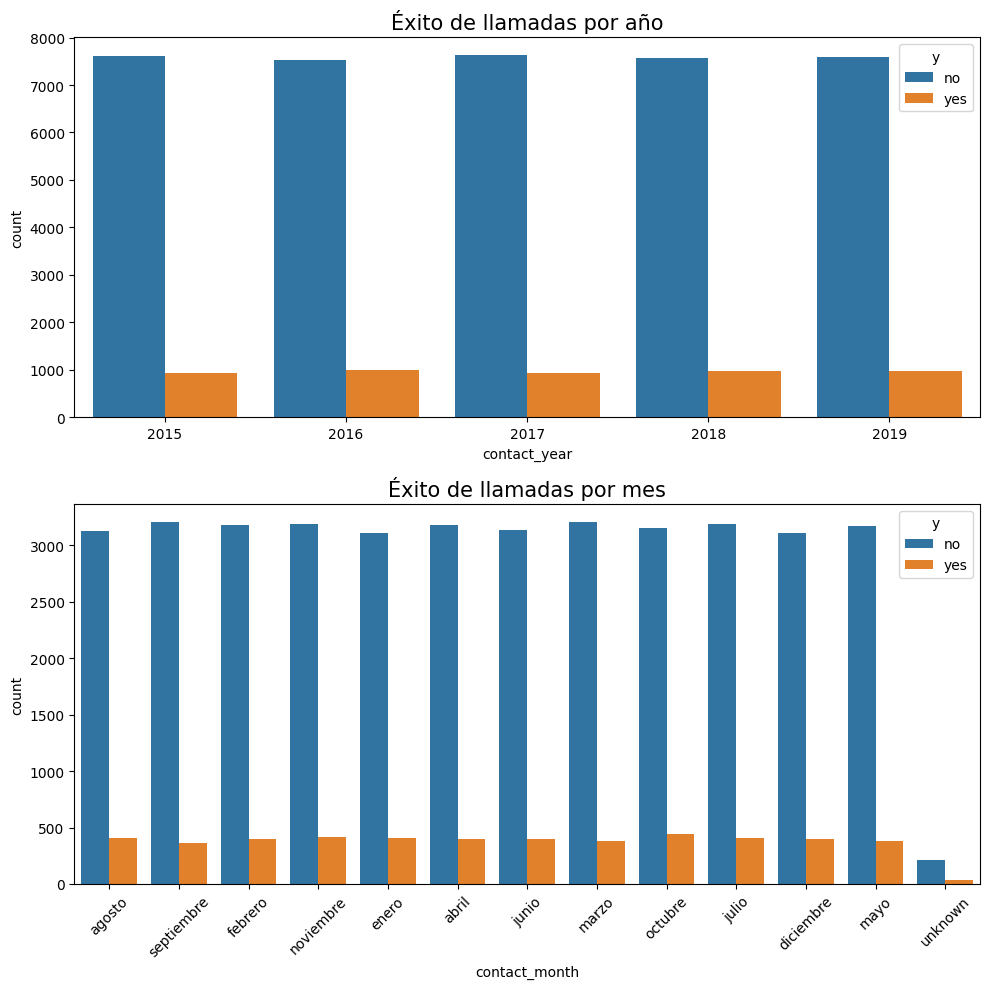

In [120]:
# Crear DataFrame con mes y año de contacto
bank_mes_año = bank[['campaign','y','contact_month','contact_year']]
bank_mes_año['contact_year'] = pd.to_numeric(bank_mes_año['contact_year'], errors='coerce').astype('Int64') # convierte año de contacto a entero

#subplots para ordenar los dos gráficos en uno
figure,ax=plt.subplots(nrows=2,ncols=1,figsize=(10,10))
#distribución de las llamadas por mes
sns.countplot(x='contact_month', data=bank_mes_año, hue = 'y', ax=ax[1])
plt.xticks(rotation = 45)
#distribución dew las llamadas por años
ax[0].set_title('Éxito de llamadas por año', fontsize = 15)
sns.countplot(x='contact_year', data=bank_mes_año, hue = 'y', ax=ax[0])
ax[1].set_title('Éxito de llamadas por mes', fontsize = 15)
plt.tight_layout()

En el primer gráfico se puede ver que la efectividad de las distintas campañas ha sido muy similar y en el segundo gráfico se ve que a lo largo de los meses la distribución del éxito de las llamadas ha sido homogénea sin destacar de manera relevante algún mes sobre los otros.

## Gráfico para establecer la relación las veces que se ha contactado con el cliente y el éxito de contratación:

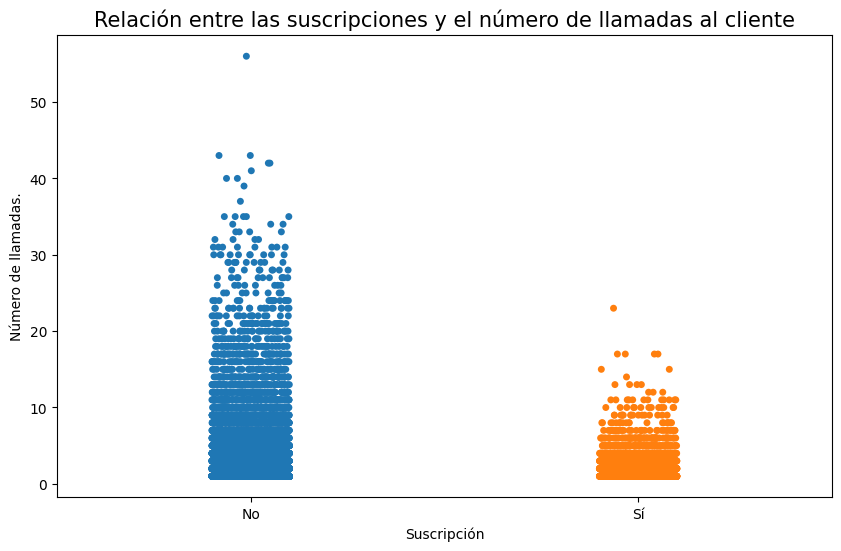

In [121]:
# Visualización de duración de la campaña con el éxito
plt.figure(figsize=(10, 6))
sns.stripplot(x = 'y', y = 'campaign', data = bank, hue = 'y', legend = False)
plt.xlabel('Suscripción')
plt.ylabel('Número de llamadas.')
plt.xticks(['no', 'yes'], ['No', 'Sí'])
plt.title('Relación entre las suscripciones y el número de llamadas al cliente',fontsize = 15)
plt.show()

La relación entre el número de veces que se ha contactado con el cliente y la suscripción del producto es negativa, por lo que se puede interpretar que llamar demasiadas veces a un cliente es contraproducente.

## Gráfico para relacionar la Tasa de éxito de la campaña con los contactos previos:

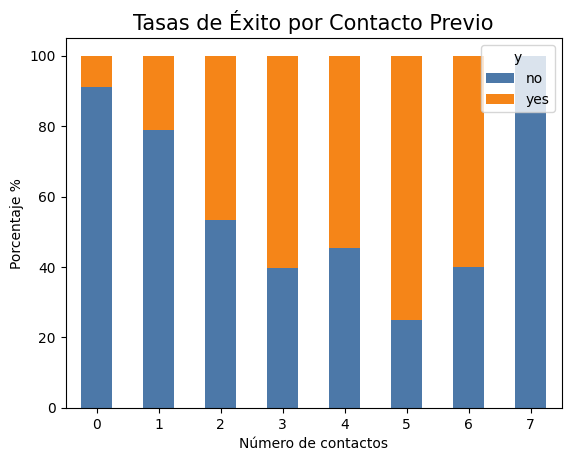

In [122]:
# Crear una nueva columna para indicar si el cliente fue contactado previamente
bank_previous = bank[['previous','y']]
bank_previous

# Comparar tasas de éxito
success_by_contact = bank_previous.groupby('previous')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Visualizar tasas de éxito
success_by_contact.plot(kind='bar', stacked=True, color=['#4C78A8', '#F58518'])
plt.ylabel('Porcentaje %')
plt.xlabel('Número de contactos')
plt.title('Tasas de Éxito por Contacto Previo',fontsize = 15)
plt.xticks(rotation=0)
plt.show()

La relación entre el éxito y si se ha contactado previamente es positiva, indicador de que si ha habido un contacto previo hay más posibilidades de que el cliente contrate el producto. Estando su máximo entre los 3 y los 6 contactos.

## Gráfico para establecer la relación entre la duración de las llamadas y el éxito de contratación:

In [123]:
# Dataframe con 'duration' convertida a minutos
duration_minutes = bank[['duration','campaign','y', 'previous']]
duration_minutes['minutes'] = duration_minutes[['duration']] / 60
#duration_minutes['minutosent'] = duration_minutes[['duration']] // 60
#duration_minutes['seconds'] = duration_minutes[['duration']] % 60

C:\Users\win\AppData\Local\Temp\ipykernel_9680\335147519.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,duration,campaign,y,previous,minutes
0,261,1,no,0,4.350000
1,149,1,no,0,2.483333
2,226,1,no,0,3.766667
3,151,1,no,0,2.516667
4,307,1,no,0,5.116667
...,...,...,...,...,...
42995,618,2,yes,0,10.300000
42996,42,7,no,0,0.700000
42997,391,2,no,0,6.516667
42998,674,3,no,0,11.233333


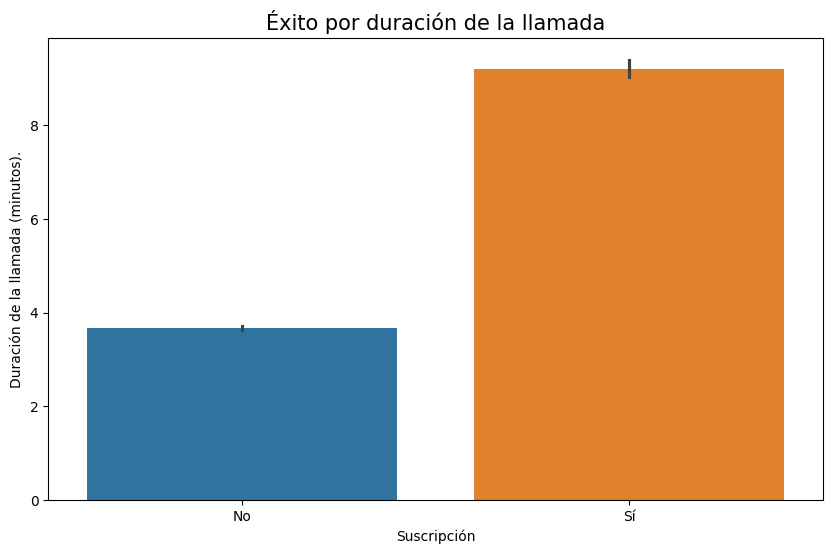

In [124]:
# Gráfico de relación entre el éxito y la duración de la llamada en minutos
plt.figure(figsize=(10, 6))
sns.barplot(data = duration_minutes, x = 'y', y = 'minutes',  hue = 'y', legend = False)
plt.xlabel('Suscripción')
plt.ylabel('Duración de la llamada (minutos).')
plt.xticks(['no', 'yes'], ['No', 'Sí'])
plt.title('Éxito por duración de la llamada',fontsize = 15)
plt.show()

La relación entre la duración de la llamada y el éxito de contratación es positiva, parece que las llamadas con más duración tienen más probabilidad de contratar el producto.

## Comparación en un diagrama de dispersión de la duración de las llamadas con el número de contactos para valorar el exito según estos dos parametros.

In [125]:
# Gráfico de Dispersión de Duración de Llamadas vs. Éxito
fig = px.scatter(duration_minutes, x='minutes', y='campaign', color='y', color_discrete_map = {'yes': '#F58518','no':'#4C78A8'}, opacity= 0.8,
                 labels={'duration': 'Duración de Llamada (segundos)', 'campaign': 'Número de Contactos'},
                 title='Duración de Llamadas vs. Número de Contactos')
# Centrar el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Duración de Llamadas vs. Número de Contactos',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    barmode='group'
)
fig.show()


Duración de la Llamada:
Las llamadas con mayor duración tienden a resultar en un mayor número de suscripciones exitosas.
Esto sugiere que dedicar más tiempo a cada llamada puede aumentar la probabilidad de éxito.

Número de Contactos:
Las suscripciones exitosas no necesariamente requieren un alto número de contactos.
De hecho, un menor número de contactos combinados con llamadas más largas parece ser una estrategia más efectiva.
Tendencias Identificadas:

Se observa una mayor densidad de puntos exitosos en el rango de llamadas de 3 a 7 minutos con menos de 5 contactos.El contacto previo con el cliente parace facilitar la contratación, siempre y cuando no se llame demasiadas veces al mismo cliente. Una llamada puede ser efectiva en el primer o segundo intento si se dedica el tiempo adecuado.

## Gráfico con la distrubución de los días que han pasado desde el último contacto después de quitar los valores desconocidos:

C:\Users\win\AppData\Local\Temp\ipykernel_9680\4171427358.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



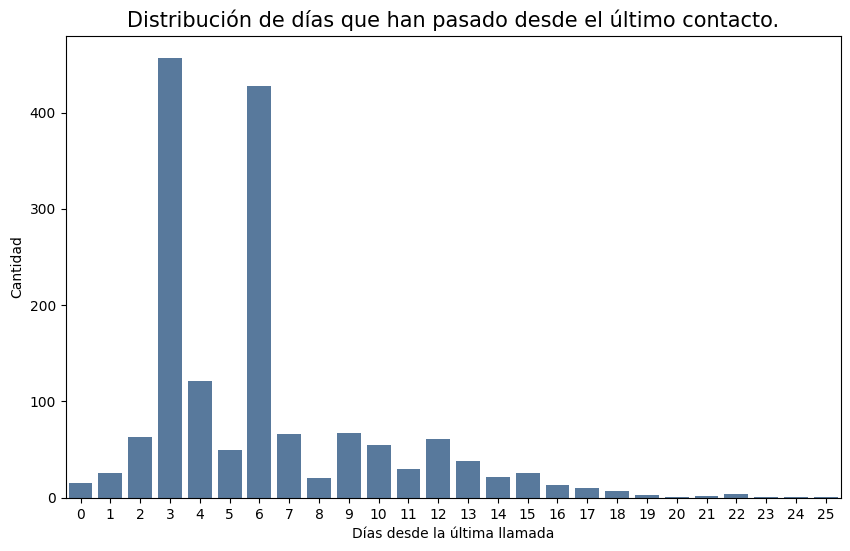

In [128]:

# Filtrar datos para obtener solo aquellos que fueron contactados previamente
bank_contact = bank[bank['pdays'] != 'unknown']

# Convertir pdays a decimal
bank_contact['pdays'] = bank_contact['pdays'].astype(float)

# Ordenar los valores de pdays de menor a mayor
bank_contact = bank_contact.sort_values('pdays')

# Graficar
plt.figure(figsize=(10, 6))
sns.countplot(data=bank_contact, x='pdays', color= '#4C78A8', order=sorted(bank_contact['pdays'].unique()))
plt.xlabel('Días desde la última llamada')
plt.ylabel('Cantidad')
plt.title('Distribución de días que han pasado desde el último contacto.', fontsize = 15)
plt.xticks(rotation=90)

# Formatear las etiquetas del eje x para que no muestren decimales
current_ticks = plt.xticks()[0]
plt.xticks(current_ticks, [int(tick) for tick in current_ticks], rotation = 0)

plt.show()


En la mayoría de los casos han pasado 3 ó 6 días desde el último contacto.

## Gráfico que relaciona el éxito y el número de días que han pasado desde el último contacto con el cliente:

C:\Users\win\AppData\Local\Temp\ipykernel_9680\1640991316.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




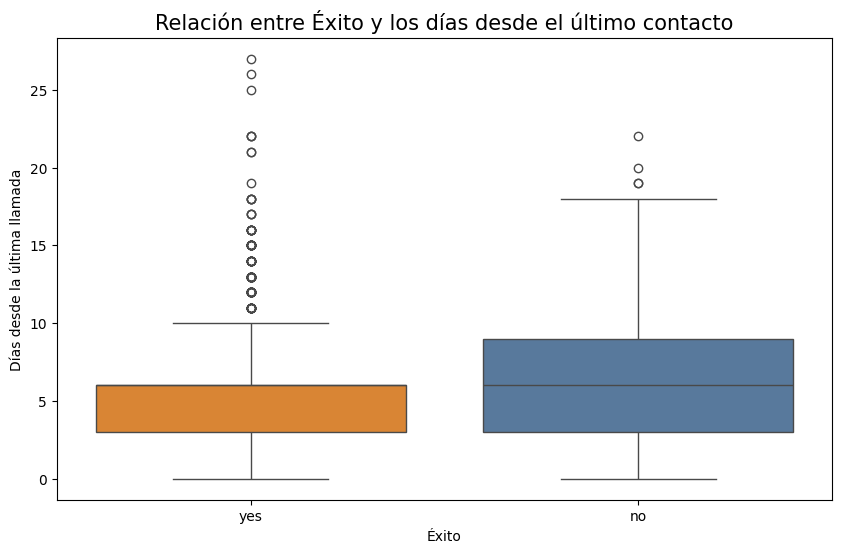

In [127]:

# Relación entre pdays y éxito
plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='pdays', data=bank_contact, palette={'yes': '#F58518', 'no': '#4C78A8'})
plt.xlabel('Éxito')
plt.ylabel('Días desde la última llamada')
plt.title('Relación entre Éxito y los días desde el último contacto', fontsize = 15)
plt.show()


La relación entre el número de días que han pasado desde el último contacto y el éxito no es significativa pero si se ñpuede apreciar que si no han pasado más de 6 días desde el último contacto hay una mayor posibilidad de contratación.

## Gráfico para mostrar la relación del número de visitas a la web y el éxito de contratación:

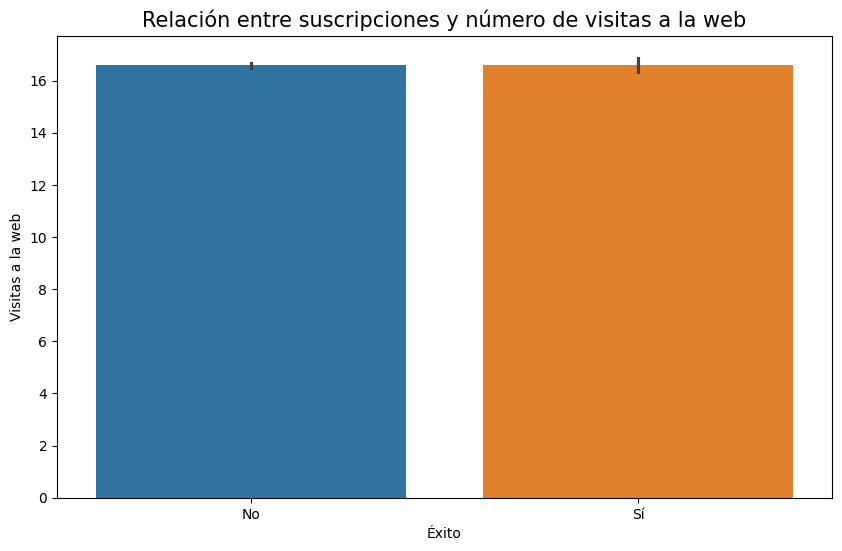

In [129]:
# Relación entre el éxito y las visitas a la web
plt.figure(figsize=(10, 6))
sns.barplot(data = bank, x = 'y', y = 'numwebvisitsmonth', hue = 'y', legend = False)
plt.xlabel('Éxito')
plt.ylabel('Visitas a la web')
plt.xticks(['no', 'yes'], ['No', 'Sí'])
plt.title('Relación entre suscripciones y número de visitas a la web',fontsize = 15)
plt.show()

No se puede apreciar que haya una relación directa entre el número de visitas a la web y el éxito de contratación.

## Gráfico de con la tasa de Éxito por tipo de contacto:

In [130]:
# Crea un DataFrame con el tipo de contacto, el tipo de suscripción, un contador de "yes" y "no"
df_contact = bank.groupby(['contact', 'y']).size().reset_index(name='count')

# Calcular el porcentaje de éxito para cada tipo de contacto
contact_totals = df_contact.groupby('contact')['count'].transform('sum')
df_contact['percentage'] = df_contact['count'] / contact_totals * 100

#Crea el gráfico
# Gráfico de Barras Apiladas por Tipo de Contacto y Éxito
fig = px.bar(df_contact, x='contact', y='count', color='y', 
             labels={'count': 'Número de Contactos', 'y': 'Suscripción Exitosa'},
             title='Tasa de Éxito por Tipo de Contacto',
             color_discrete_map = {'yes': '#F58518', 'no': '#4C78A8'},
             text=df_contact['percentage'].apply(lambda x: f'{x:.1f}%'),
             height=600)

# Personaliza la disposición de las etiquetas
fig.update_traces(textposition='outside', insidetextanchor='middle')

# Centra el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Tasa de Éxito por Tipo de Contacto',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    barmode='group'
)

fig.show()

En este gráfico se puede ver que hay mayor número de contactos por teléfono móvil que por teléfono fijo.También se aprecia claramente que el porcentaje de contratación es más alto al contactar por el móvil.

## Distribución de la edad de los clientes:

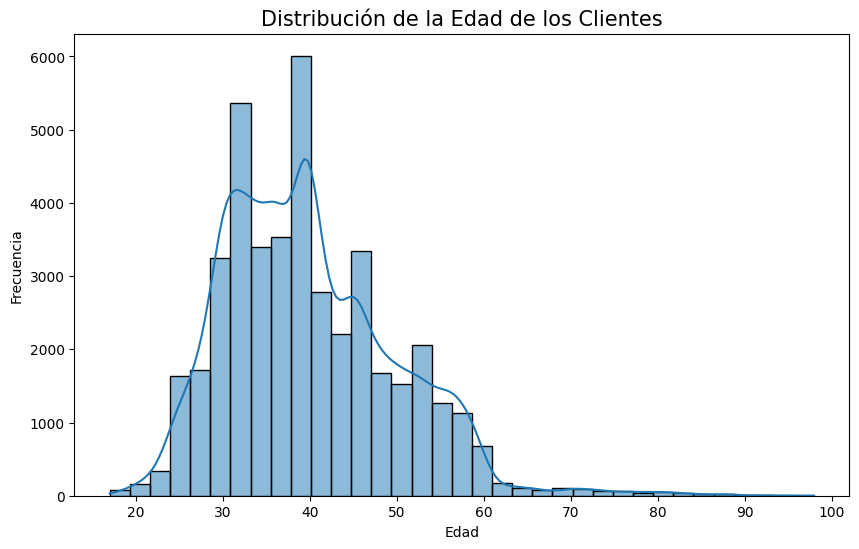

In [131]:
plt.figure(figsize=(10, 6))
sns.histplot(bank['age'], bins=35, kde=True)
plt.title('Distribución de la Edad de los Clientes', fontsize = 15)
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

La distribución de la edad de los clientes del banco revela una mayor concentración en el rango de 30 a 55 años, con una edad promedio alrededor de los 40 años.

## Gráficos de violín para comparar el éxito de la campaña por grupos de edad:

In [132]:
# Crear el gráfico de violín
fig = px.violin(bank, x='y', y='age', color='y', box=True, height=800,
                color_discrete_map={'yes': '#F58518', 'no': '#4C78A8'},
                labels={'y': 'Suscripción', 'age': 'Edad'},
                title='Relación entre Éxito de Suscripción y la Edad')

# Personalizar el gráfico
fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=['no', 'yes'],
        ticktext=['No', 'Sí']
    ),
    title={
        'text': 'Relación entre Éxito de Suscripción y la Edad',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    }
)

fig.show()

## Gráfico de barras con los porcentajes de contratación por grupos de edad:

In [134]:
# Crear una columna de grupo de edad
def age_group(age):
    if age < 20:
        return '<20'
    elif 20 <= age <= 30:
        return '20-30'
    elif 31 <= age <= 40:
        return '31-40'
    elif 41 <= age <= 50:
        return '41-50'
    elif 51 <= age <= 60:
        return '51-60'
    else:
        return '>60'

bank_age = bank[['age', 'y']]
bank_age['age_group'] = bank['age'].apply(age_group)

# Crear un DataFrame con el recuento de "yes" y "no" por cada grupo de edad
age_group_success = bank_age.groupby(['age_group', 'y']).size().reset_index(name='count')

# Calcular el porcentaje de éxito para cada grupo de edad
age_group_totals = age_group_success.groupby('age_group')['count'].transform('sum')
age_group_success['percentage'] = age_group_success['count'] / age_group_totals * 100

# Gráfico de Barras por Grupo de Edad y Éxito
fig = px.bar(age_group_success, x='age_group', y='count', color='y', 
             labels={'count': 'Número de Suscripciones', 'y': 'Suscripción Exitosa', 'age_group': 'Grupo de Edad'},
             title='Tasa de Éxito por Grupo de Edad',
             color_discrete_map={'yes': '#F58518', 'no': '#4C78A8'},
             text=age_group_success['percentage'].apply(lambda x: f'{x:.1f}%'),
             height=600)

# Personalizar la disposición de las etiquetas
fig.update_traces(textposition='outside', insidetextanchor='middle')

# Centrar el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Tasa de Éxito por Grupo de Edad',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    barmode='group'
)

fig.show()


C:\Users\win\AppData\Local\Temp\ipykernel_9680\3727862751.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



 La relación entre la edad y el éxito de la suscripción muestra que los clientes de 30 a 50 años tienen una mayor probabilidad de suscribirse a los productos bancarios ofrecidos. Esto indica la necesidad de segmentar y dirigir las campañas de marketing de manera más efectiva hacia estos grupos de edad para maximizar la tasa de éxito ya que son el grupo más numeroso de la muestra. Por otro lado el porcentaje de contratación más alto está en los clientes mayores de 60 años con un 29,9% de éxito aunque este no es tan numeroso.

## Gráficos de violín para comparar el éxito de la campaña por edad y tipo de contacto:

In [135]:
# Crear el gráfico de violín
fig = px.violin(bank, x='contact', y='age', color='y', box=True, height=600,
                color_discrete_map={'yes': '#F58518', 'no': '#4C78A8'},
                labels = dict(age = 'Edad del usuario', contact = 'Forma de contacto'),
                )

# Personalizar el gráfico
fig.update_layout(title = dict(text = 'Distribución de las Suscripciones por Tipo de Contacto y Edad', 
				font = dict(size = 24),
				automargin = True,
				yref = 'paper',
				x = 0.5,
				y = 0.9),
 				showlegend=True,
    			legend_title_text='Suscripción'
)
fig.show()

Móvil: La mayoría de las suscripciones exitosas y no exitosas se concentran en el rango de edad entre 30 y 50 años, se observa una ligera disminución en el éxito de las suscripciones a medida que la edad aumenta más allá de los 60 años. Esto sugiere que los contactos realizados a través del móvil son efectivos en una amplia gama de edades, pero la población es ligeramente más joven de promedio.

Teléfono Fijo: La distribución de edades para los contactos por teléfono fijo también se concentra en el rango de 30 a 50 años, aunque con una menor dispersión. Esto podría indicar que los usuarios contactados por teléfono fijo tienden a ser ligeramente mayores en promedio que aquellos contactados por el móvil. La proporción de suscripciones exitosas es más baja en comparación con el móvil.

### Recomendaciones:
Dado que el contacto por el móvil muestra una mayor efectividad en el rango de 30 a 50 años, sería recomendable enfocar las campañas de marketing en este grupo de edad cuando se utilice este método de contacto.
Como las suscripciones exitosas son menos frecuentes en contactos por teléfono fijo, podría ser beneficioso reconsiderar la estrategia de contacto con este método, especialmente para usuarios mayores.
Las campañas de marketing podrían basarse en una segmentación por grupos de edad, optimizando los mensajes y las ofertas según las preferencias y comportamientos de diferentes grupos de edad.
Este análisis proporciona una visión clara de cómo la edad y el tipo de contacto influyen en el éxito de las suscripciones, permitiendo a la entidad bancaria tomar decisiones más informadas para futuras campañas publicitarias.

## Gráfico de relación del éxito de la campaña por el estado civil:

In [136]:
# Crea un DataFrame con el conteo de clientes que se han suscrito en función de su estado civil
df_marital_yes = bank[bank['y'] == 'yes'].groupby('marital')['id'].count().reset_index()

# Crea un DataFrame con el conteo de clientes que no se han suscrito en función de su estado civil
df_marital_no = bank[bank['y'] == 'no'].groupby('marital')['id'].count().reset_index()

#Crea el gráfico
fig = make_subplots(
    rows = 1, cols = 2,
    column_widths = [3, 2],
    row_heights = [3],
    specs = [[{"type": "domain"}, {"type": "domain"}]], subplot_titles = ['Éxito', 'Fracaso'])
fig.add_trace(go.Pie(hole = 0.5,labels = ['divorced','married','single'],
						 values = df_marital_yes['id'],
             name ='marital'
             ),
             row = 1,col = 1)
fig.add_trace(go.Pie(hole = 0.5, labels = ['divorced','married','single'],
						 values = df_marital_no['id'],
             name ='marital'
             ),
             row = 1,col = 2)
# Centrar el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Distribución del Éxito por Estado civil',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    showlegend=True,
    legend_title_text='Estado Civil:'
)

## Gráfico de barras con la Tasa de Éxito por estado civil:

In [137]:
# Crea un DataFrame con el conteo de "yes" y "no" por cada estado civil
marital_success = bank.groupby(['marital', 'y']).size().reset_index(name='count')

# Calcular el porcentaje de éxito para cada estado civil
marital_totals = marital_success.groupby('marital')['count'].transform('sum')
marital_success['percentage_marital'] = marital_success['count'] / marital_totals * 100

# Gráfico de Barras Apiladas por Estado Civil y Éxito
fig = px.bar(marital_success, x='marital', y='count', color='y', 
             labels={'count': 'Número de Suscripciones', 'y': 'Suscripción Exitosa'},
             title='Tasa de Éxito por Ocupación',
             color_discrete_map = {'yes': '#F58518', 'no': '#4C78A8'},
             text=marital_success['percentage_marital'].apply(lambda x: f'{x:.1f}%'),
             height=600)

# Personalizar la disposición de las etiquetas
fig.update_traces(textposition='outside', insidetextanchor='middle')

# Centrar el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Tasa de Éxito por Estado Civil',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    barmode='group'
)

fig.show()

Los clientes casados son mayoría tanto en las suscripciones exitosas como de las no exitosas. Esto se debe  a que este grupo es el más grande en la muestra.
Los clientes solteros muestran una buena proporción de suscripciones exitosas mayor que en los otros grupos. Aunque representan una menor proporción en comparación con los casados, su tasa de éxito es significativamente más alta.
Los clientes divorciados forman la menor proporción tanto en suscripciones exitosas como no exitosas. Este grupo parece tener la menor interacción en la campaña.
Entre las suscripciones exitosas, los clientes casados predominan, seguidos por los solteros y los divorciados.
Dado que los clientes casados representan el mayor número de contactos, se puede deducir que este grupo tiene la mayor probabilidad de ser contactado en campañas futuras.

## Gráficos con la relación entre el Éxito de la Campaña y el número de adolescentes y de niños en casa:

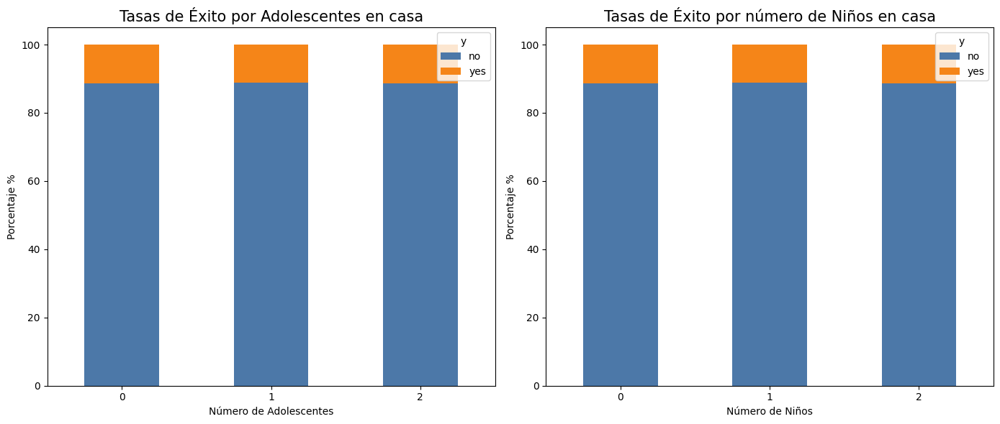

In [138]:
# Dataframe con las columnas 'teenhome' e 'y'
bank_teen = bank[['teenhome','y']]

# Comparar tasas de éxito
success_teen = bank_teen.groupby('teenhome')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Dataframe con las columnas 'kidhome' e 'y'
bank_kid = bank[['kidhome','y']]

# Comparar tasas de éxito
success_kid = bank_kid.groupby('kidhome')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Crear la figura y los subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Primer gráfico: Tasas de éxito por número de adolescentes en casa
success_teen.plot(kind='bar', stacked=True, color=['#4C78A8', '#F58518'], ax=axes[0])
axes[0].set_ylabel('Porcentaje %')
axes[0].set_xlabel('Número de Adolescentes')
axes[0].set_title('Tasas de Éxito por Adolescentes en casa', fontsize=15)
axes[0].set_xticklabels(success_teen.index, rotation=0)

# Segundo gráfico: Tasas de éxito por número de niños en casa
success_kid.plot(kind='bar', stacked=True, color=['#4C78A8', '#F58518'], ax=axes[1])
axes[1].set_ylabel('Porcentaje %')
axes[1].set_xlabel('Número de Niños')
axes[1].set_title('Tasas de Éxito por número de Niños en casa', fontsize=15)
axes[1].set_xticklabels(success_kid.index, rotation=0)

# Ajustar el layout para evitar solapamientos
plt.tight_layout()
plt.show()


Parece que no hay una relación entre el número de adolescentes o de niños en casa y el resultado de la campaña.

## Gráfico de barras de la tasa de éxito por ocupación:

In [139]:
# Crea un DataFrame con el conteo de "yes" y "no" por cada ocupación
ocupation_success = bank.groupby(['job', 'y']).size().reset_index(name='count')

# Calcular el porcentaje de éxito para cada ocupación
ocupation_totals = ocupation_success.groupby('job')['count'].transform('sum')
ocupation_success['percentage'] = ocupation_success['count'] / ocupation_totals * 100

# Gráfico de Barras Apiladas por Ocupación y Éxito
fig = px.bar(ocupation_success, x='job', y='count', color='y', 
             labels={'count': 'Número de Suscripciones', 'y': 'Suscripción Exitosa'},
             title='Tasa de Éxito por Ocupación',
             color_discrete_map = {'yes': '#F58518', 'no': '#4C78A8'},
             text=ocupation_success['percentage'].apply(lambda x: f'{x:.1f}%'),
             height=600)

# Personalizar la disposición de las etiquetas
fig.update_traces(textposition='outside', insidetextanchor='middle')

# Centrar el título del gráfico y aumentar el tamaño de la fuente
fig.update_layout(
    title={
        'text': 'Tasa de Éxito por Ocupación',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    barmode='group'
)

fig.show()


La tasa de éxito por ocupación no es significativa, no hay ningún tipo de trabajo donde el porcentaje de éxito sea mucho mayor que en el resto, lo que se puede apreciar es que hay mayor número de clientes  en administración (admin. con una tasa de éxito del 13%) y obreros  (blue-collar con una tasa de éxito del 6.9%) que del resto de ocupaciones. Convendría estudiar el dirigir campañas enfocadas a esos dos sectores profesionales para optimizar loa resultados.

## Gráfico que muestra el Éxito por los Ingresos Anuales:

In [140]:
fig = px.box(bank, x='y', y='income', color='y', height=800,
             color_discrete_map={'yes': '#F58518', 'no': '#4C78A8'},
             labels={'income': 'Ingresos', 'y': 'Éxito de Suscripción'},
             title='Distribución de Ingresos por Éxito de Suscripción')

fig.update_layout(
    title={
        'text': 'Distribución de Ingresos por Éxito de Suscripción',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}
    }
)
fig.show()

Podemos observar que la mediana de los ingresos de los clientes que deciden suscribirse es algo menor que la de los ingresos de los clientes que deciden no suscribirse. Pero esta diferencia no es significativa.

## Graficos comparativos entre la Camapaña Actual y la Campaña Anterior:

In [142]:
# DataFrame con el recuento de id en función de las suscripciones o no
bank_y = bank.groupby('y')['id'].count().reset_index()

# Crear el DataFrame con las columnas 'id' y 'poutcome'
poutcome_y = bank[['poutcome', 'id']].copy()

# Reemplazar los valores de 'poutcome' para estandarizar con 'y'
poutcome_y['poutcome'] = bank['poutcome'].apply(lambda x: 'yes' if x == 'success' else 'no')

# Gráfico comparativo del recuento de éxitos en 'y' y 'poutcome'
counts_poutcome = poutcome_y.groupby('poutcome')['id'].count().reset_index()

# Crear los gráficos de pie
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "domain"}, {"type": "domain"}]],
    subplot_titles=['Distribución de la Campaña Anterior', 'Distribución de la Campaña Actual']
)

fig.add_trace(go.Pie(labels=counts_poutcome['poutcome'], values=counts_poutcome['id'], 
                     marker=dict(colors=['#4C78A8', '#F58518']), name='Poutcome'), 
              row=1, col=1)

fig.add_trace(go.Pie(labels=bank_y['y'], values=bank_y['id'], 
                     marker=dict(colors=['#4C78A8', '#F58518']), name='Contratación'), 
              row=1, col=2)

# Personalizar el diseño
fig.update_layout(
    title={
        'text': 'Comparación de Distribuciones de Éxito entre Camapañas',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}
    },
    showlegend=True,
    legend_title_text='Resultado'
)

fig.show()

Al comparar el resultado de las dos campañas parece que el número de contrataciones ha aumentado  un 8% en la campaña actual con respecto a la anterior, lo que triplica el número de contratos. 

## Gráfico que muestra el porcentaje de clientes que ha contratado en esta campaña después de haber dicho que no en la campaña anterior:

In [143]:
# Filtrar los casos donde 'poutcome' es 'failure' y 'y' es 'yes'
failure_to_success = bank[(bank['poutcome'] == 'failure') & (bank['y'] == 'yes')]
failure = bank[(bank['poutcome'] == 'failure')]

# Contar el número de casos de 'yes' después de 'failure'
success_count = len(failure_to_success)

# Crear un DataFrame para el gráfico
data = {'Resultado': ['Exitoso después de fallo', 'Fracaso'],
        'Cantidad': [success_count, len(failure) - success_count]}

df_poutcome = pd.DataFrame(data)

# Crear el gráfico de pie
fig = px.pie(df_poutcome, values='Cantidad', names='Resultado',
             color='Resultado', 
             color_discrete_map={'Exitoso después de fallo': '#F58518', 'Fracaso': '#4C78A8'},
             title='Conversión de Clientes después de un Fallo Previo')

# Personalizar el gráfico
fig.update_layout(
    title={
        'text': 'Conversión de Clientes después de un Fracaso Previo',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}  # Tamaño de la fuente del título
    },
    showlegend=True,
    legend_title_text='Resultado'
)

fig.show()


Esto puede ser un indicador de confianza, cuando el cliente ya sabe con anterioridad del producto hay mayor probabilidad de que en futuras campañas contrate. 

## Gráfico Evolutivo de Comparación de las Variables Macroeconómicas con respecto a la Tasa de Éxito:  

In [144]:
# Ordenar los datos por fecha
bank_sorted = bank.sort_values(by='date')

# Crear el gráfico de línea múltiple
fig = go.Figure()

# Añadir líneas para cada variable macroeconómica
variables = ['emp_var_rate', 'cons_price_idx', 'cons_conf_idx', 'euribor3m']
colors = ['#1f77b4', '#9467bd','#d62728' ,'#2ca02c']

for var, color in zip(variables, colors):
    fig.add_trace(go.Scatter(x=bank_sorted['date'], y=bank_sorted[var], mode='lines', name=var, line=dict(color=color)))

# Añadir una línea para la tasa de éxito (proporción de 'yes') a lo largo del tiempo
success_rate = bank_sorted.groupby('date')['y'].apply(lambda x: (x == 'yes').mean())
fig.add_trace(go.Scatter(x=success_rate.index, y=success_rate, mode='lines', name='Tasa de Éxito', line=dict(color='#F58518', dash='dot')))

# Personalizar el diseño del gráfico
fig.update_layout(
    title={
        'text': 'Evolución de Variables Macroeconómicas y Tasa de Éxito',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}
    },
    xaxis_title='Fecha',
    yaxis_title='Valor',
    legend_title='Variable',
    height=600
)

fig.show()


Parece que no hay una relación significativa entre la tasa de éxito con las otras variables, por lo que no se puede hacer una afirmación rotunda de que influyen en la contratación del producto ofrecido en la campaña.

# **Informe Final: Análisis de la Campaña de Marketing Telefónico de la Entidad Bancaria Portuguesa.**

---

#### **Introducción**

El análisis exploratorio de datos (EDA) incluyó la limpieza y transformación de los datos, la creación de visualizaciones para identificar patrones, y el análisis de tendencias clave. La base de datos utilizada fue filtrada para eliminar valores nulos, asegurando que los resultados fueran representativos y precisos.
Este informe presenta un análisis exhaustivo de una campaña de marketing telefónico llevada a cabo por una entidad bancaria en Portugal. El objetivo de la campaña era vender productos financieros a través de llamadas telefónicas. A lo largo del análisis, se examinaron diversos aspectos de la campaña, incluyendo la efectividad en diferentes periodos, la relación entre el número y la duración de las llamadas con el éxito de la campaña, y el impacto de variables demográficas como la edad, estado civil, ocupación, y tipo de contacto en las tasas de éxito.


#### **Resultados del Análisis**

##### 1. **Llamadas Realizadas por Mes y Año**

Se observó que no hay una variación significativa en el número de llamadas realizadas entre los meses de las diferentes campañas. La diferencia de llamadas entre meses no excedió las 100, indicando una consistencia en la ejecución de las campañas a lo largo del tiempo.

##### 2. **Tasa de Contratación de Productos**

El porcentaje de contratación de los productos ofrecidos es bajo, con un 11.3% de los clientes que aceptaron la oferta frente a un 88.7% que no lo hizo. Este dato refleja la necesidad de evaluar y posiblemente mejorar la estrategia de venta para aumentar la tasa de éxito.

##### 3. **Relación entre Número de Contactos y Éxito de la Campaña**

- **Número de Contactos**: Se encontró que contactar repetidamente a los clientes tiende a ser contraproducente. La relación entre el número de veces que se contactó al cliente y la suscripción al producto es negativa. Sin embargo, los contactos previos pueden aumentar las posibilidades de éxito, especialmente si se limita el número de intentos a entre 3 y 6 llamadas.

- **Duración de las Llamadas**: Las llamadas más largas tienden a tener una mayor tasa de éxito. Dedicar más tiempo a una llamada parece incrementar las probabilidades de que un cliente acepte la oferta.

##### 4. **Impacto de Variables Demográficas**

- **Edad**: La mayor parte de los clientes del banco se concentran en el rango de 30 a 55 años, con una edad promedio alrededor de los 40 años. Los clientes dentro de este rango tienen una mayor probabilidad de suscribirse a los productos ofrecidos, ya que son la muestra más amplia. Sin embargo, el porcentaje más alto de éxito se encontró en clientes mayores de 60 años, aunque este grupo es menos numeroso.

- **Tipo de Contacto**: El contacto por teléfono móvil resultó ser más efectivo que el contacto por teléfono fijo. Se observó una mayor tasa de éxito en las llamadas realizadas a través de teléfonos móviles, especialmente en el grupo de edad de 30 a 50 años.

- **Estado Civil**: Los clientes casados representaron el mayor número de contactos y suscripciones exitosas, seguidos por los solteros. Aunque los solteros tuvieron una tasa de éxito relativamente alta, los casados fueron el grupo con más interacción en la campaña.

- **Ocupación**: No se identificó una relación significativa entre la ocupación y la tasa de éxito, aunque los clientes en administración y obreros fueron los grupos más numerosos. Estos grupos pueden ser buenos candidatos para campañas futuras enfocadas específicamente en ellos.

##### 5. **Comparación con Campañas Anteriores**

Al comparar los resultados de esta campaña con una campaña anterior, se observó un aumento del 8% en el número de contrataciones, lo que indica una mejora significativa en la efectividad de la campaña y que algunos pese a que en la campaña anterior no habían contratado en la última sí lo habían hecho.

##### 6. **Relación con Variables Macroeconómicas**

El análisis no encontró una relación significativa entre las variables macroeconómicas y la tasa de éxito de la campaña, lo que sugiere que otros factores, posiblemente más específicos al cliente, tienen un mayor impacto en la decisión de suscribirse a los productos ofrecidos.

#### **Conclusiones y Recomendaciones**

El análisis revela varios aspectos clave que pueden ayudar a optimizar futuras campañas de marketing:

1. **Estrategia de Contacto**: Reducir el número de llamadas y centrarse en la calidad de cada contacto podría mejorar significativamente las tasas de suscripción.

2. **Segmentación por Edad**: Dado que los clientes entre 30 y 50 años muestran una mayor disposición a suscribirse, las campañas deberían centrarse en este grupo de edad, particularmente a través de contactos por móvil.

3. **Tipo de Contacto**: Priorizar el uso de teléfonos móviles en lugar de fijos podría aumentar las tasas de éxito, especialmente entre los clientes más jóvenes.

4. **Optimización de la Duración de las Llamadas**: Dedicando más tiempo a cada llamada, se puede mejorar la probabilidad de contratación, especialmente en los primeros intentos de contacto.

5. **Campañas Enfocadas en Ocupación**: Considerar estrategias específicas para los sectores de administración y obreros podría maximizar los resultados, dado el alto número de clientes en estos grupos.
